### _Model Testing File_

Imports

In [75]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import scipy as sp
import requests
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import problem
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from xgboost import XGBRegressor
import xgboost as xgb
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import joblib

### _Loading Data and Processing_

In [76]:
data = pd.read_parquet(Path("data") / "train.parquet")

In [77]:
X_train, y_train = problem.get_train_data()
X_test, y_test = problem.get_test_data()

In [78]:
df_weather = pd.read_csv("external_data1.csv")
df_weather['date'] = pd.to_datetime(df_weather.date)
df_weather.drop(df_weather.columns[0], axis=1, inplace=True)
df_weather.head()

,date,Temperature (C),wind_dir,wind_speed,Humidity,Visibility,Precipitation,pressure1,sunshine_time,suntime,new_cases,date_only,holidays2
0,2020-09-01 00:00:00,13.9,N,3.7,76.0,20.0,0.0,1020.4,21960.0,48255.0,5104.0,2020-09-01,0
1,2020-09-01 01:00:00,13.6,NNO,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0
2,2020-09-01 02:00:00,13.0,ONO,1.9,79.0,20.0,0.0,1019.9,21960.0,48255.0,5104.0,2020-09-01,0
3,2020-09-01 03:00:00,12.9,NO,1.9,81.0,20.0,0.0,1019.8,21960.0,48255.0,5104.0,2020-09-01,0
4,2020-09-01 04:00:00,12.4,ONO,3.7,83.0,20.0,0.0,1019.5,21960.0,48255.0,5104.0,2020-09-01,0


In [79]:
def _encode_dates(X):
    X = X.copy()  # modify a copy of X
    # Encode the date information from the DateOfDeparture columns
    X.loc[:, "year"] = X["date"].dt.year
    X.loc[:, "month"] = X["date"].dt.month
    X.loc[:, "day"] = X["date"].dt.day
    X.loc[:, "weekday"] = X["date"].dt.weekday
    X.loc[:, "hour"] = X["date"].dt.hour

    # Finally we can drop the original columns from the dataframe
    return X.drop(columns=["date"])

In [80]:
from sklearn.preprocessing import FunctionTransformer

date_encoder = FunctionTransformer(_encode_dates, validate=False)
date_encoder.fit_transform(data[["date"]]).head()

,year,month,day,weekday,hour
48321,2020,9,1,1,2
48324,2020,9,1,1,3
48327,2020,9,1,1,4
48330,2020,9,1,1,15
48333,2020,9,1,1,18


In [81]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(sparse=False)

enc.fit_transform(_encode_dates(data[["date"]])[["hour"]].head())

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

In [82]:
X_train_comb = X_train.join(df_weather.set_index("date"), on="date") 
print(X_train_comb.shape)
X_train_comb["y_train"] = y_train.copy()
X_train_comb.dropna(inplace=True)
print(X_train_comb.shape)

y_train = X_train_comb["y_train"]
X_train_comb.drop("y_train", axis=1, inplace=True)

#Do the same operations for X_test
X_test_comb = X_test.join(df_weather.set_index("date"), on="date") 
print(X_test_comb.shape)
X_test_comb["y_test"] = y_test.copy()
X_test_comb.dropna(inplace=True)
print(X_test_comb.shape)

y_test = X_test_comb["y_test"]
X_test_comb.drop("y_test", axis=1, inplace=True)
X_test_comb.shape, y_test.shape
X_train_comb.head()

(455163, 22)
(455163, 23)
(41608, 22)
(41608, 23)


,counter_id,counter_name,site_id,site_name,date,counter_installation_date,coordinates,counter_technical_id,latitude,longitude,...,wind_speed,Humidity,Visibility,Precipitation,pressure1,sunshine_time,suntime,new_cases,date_only,holidays2
400125,100049407-353255860,152 boulevard du Montparnasse E-O,100049407,152 boulevard du Montparnasse,2020-09-01 01:00:00,2018-12-07,"48.840801,2.333233",Y2H19070373,48.840801,2.333233,...,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0
408305,100049407-353255859,152 boulevard du Montparnasse O-E,100049407,152 boulevard du Montparnasse,2020-09-01 01:00:00,2018-12-07,"48.840801,2.333233",Y2H19070373,48.840801,2.333233,...,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0
87516,100036719-104036719,18 quai de l'Hôtel de Ville NO-SE,100036719,18 quai de l'Hôtel de Ville,2020-09-01 01:00:00,2017-07-12,"48.85372,2.35702",Y2H19027732,48.853720,2.357020,...,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0
98518,100036719-103036719,18 quai de l'Hôtel de Ville SE-NO,100036719,18 quai de l'Hôtel de Ville,2020-09-01 01:00:00,2017-07-12,"48.85372,2.35702",Y2H19027732,48.853720,2.357020,...,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0
875137,100063175-353277233,20 Avenue de Clichy NO-SE,100063175,20 Avenue de Clichy,2020-09-01 01:00:00,2020-07-22,"48.88529,2.32666",Y2H20073268,48.885290,2.326660,...,1.9,77.0,20.0,0.0,1020.1,21960.0,48255.0,5104.0,2020-09-01,0


### _Ridge Regression with external data_

In [83]:
# Running Basic Ridge Regression to Test the external data

date_encoder = FunctionTransformer(_encode_dates)
date_cols = _encode_dates(X_train_comb[["date"]]).columns.tolist()
scaler = StandardScaler()

categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name", "wind_dir"]
numerical_cols = X_train_comb.select_dtypes(include=np.number).columns

preprocessor = ColumnTransformer(
    [
        ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
        ("cat", categorical_encoder, categorical_cols),
        #("scaler", scaler, numerical_cols)
    ]
)

regressor = Ridge()

pipe0 = make_pipeline(date_encoder, preprocessor, regressor)
pipe0.fit(X_train_comb, y_train)

Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name',
                                                   'wind_dir'])])),
                ('ridge', Ridge())])

In [84]:
print(
    f"Train set, RMSE={mean_squared_error(y_train, pipe0.predict(X_train_comb), squared=False):.5f}"
)
print(
    f"Test set, RMSE={mean_squared_error(y_test, pipe0.predict(X_test_comb), squared=False):.5f}"
)

Train set, RMSE=0.79891
Test set, RMSE=0.71739


In [85]:
print(
    f"Train set, R^2={r2_score(y_train, pipe0.predict(X_train_comb)):.5f}"
)
print(
    f"Test set, R^2={r2_score(y_test, pipe0.predict(X_test_comb)):.5f}"
)

Train set, R^2=0.77252
Test set, R^2=0.75150


In [86]:
mask = (
    (X_test_comb["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (X_test_comb["date"] > pd.to_datetime("2021/09/01"))
    & (X_test_comb["date"] < pd.to_datetime("2021/09/08"))
)

df_viz = X_test_comb.loc[mask].copy()
df_viz["bike_count"] = np.exp(y_test[mask.values]) - 1
df_viz["bike_count (predicted)"] = np.exp(pipe0.predict(X_test_comb[mask])) - 1

Text(0, 0.5, 'bike_count')

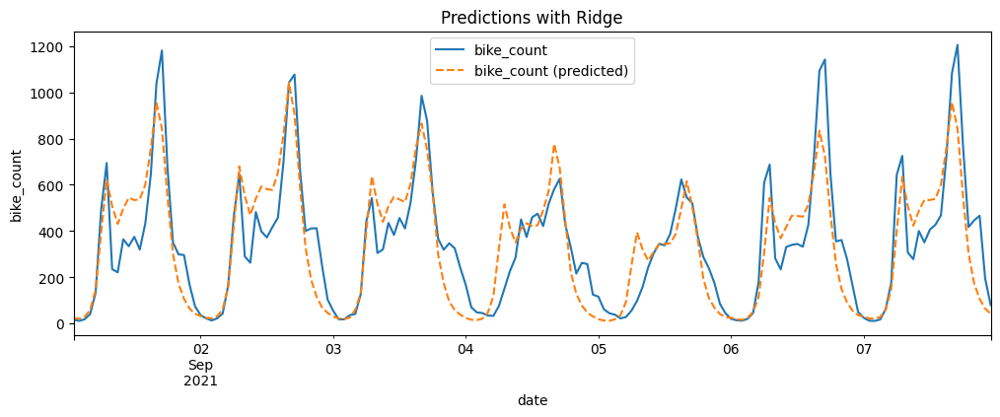

In [87]:
fig, ax = plt.subplots(figsize=(12, 4))

df_viz.plot(x="date", y="bike_count", ax=ax)
df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
ax.set_title("Predictions with Ridge")
ax.set_ylabel("bike_count") 

# Ensemble Models

## _XGBoost Regressor_

In [89]:
date_encoder = FunctionTransformer(_encode_dates)
date_cols = _encode_dates(X_train_comb[["date"]]).columns.tolist()
scaler = StandardScaler()

categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name","site_name", "wind_dir"]
numerical_cols = X_train_comb.select_dtypes(include=np.number).columns

preprocessor = ColumnTransformer(
    [
        ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
        ("cat", categorical_encoder, categorical_cols),
        ("scaler", scaler, numerical_cols)
    ]
)
params = {'learning_rate':[0.1,.05,.2], 'max_depth': [6,8,10],
          'n_estimators':[400,600],'num_parallel_tree': [2], 
          'predictor': ['auto'],  
          'tree_method': ['gpu_hist']}

Boost = XGBRegressor(**params)

pipe1 = make_pipeline(date_encoder, preprocessor, GridSearchCV(Boost,params,cv=4,n_jobs=3,verbose=10))
pipe1.fit(X_train_comb, y_train)

Fitting 4 folds for each of 18 candidates, totalling 72 fits


Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name', 'site_name',
                                                   'wind_dir']),
                                                 ('scaler', St...
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     n_estimators=[400, 600],
                                                     n_jobs=None,
                                                     num_parallel_tree=[2],
                                                     predictor=['auto'],
                                                     random_state=None, ...),
                              n_jobs=3,
                              param_grid={'learning_rate': [0.1, 0.05, 0.2],
                                          'max_depth': [6, 8, 10],
                                          'n_estimators': [400, 600],
                                          'num_parallel_tree': [2],
                                          'predictor': ['auto'],
                                          'tree_method': ['gpu_hist']},
                              verbose=10))])

In [107]:
BestXBM = pipe1[2].best_estimator_
BestXBM

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=0,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=10, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=0,
             num_parallel_tree=2, predictor='auto', random_state=0, ...)

In [93]:
print(
    f"Train set, RMSE={mean_squared_error(y_train, pipe1.predict(X_train_comb), squared=False):.5f}"
)
print(
    f"Test set, RMSE={mean_squared_error(y_test, pipe1.predict(X_test_comb), squared=False):.5f}"
)

Train set, RMSE=0.35614
Test set, RMSE=0.47961


In [92]:
print(
f"Train set, R^2={r2_score(y_train, pipe1.predict(X_train_comb)):.5f}"
)
print(
    f"Test set, R^2={r2_score(y_test, pipe1.predict(X_test_comb)):.5f}"
)

Train set, R^2=0.95480
Test set, R^2=0.88893


In [169]:
mask = (
    (X_test_comb["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (X_test_comb["date"] > pd.to_datetime("2021/09/01"))
    & (X_test_comb["date"] < pd.to_datetime("2021/09/08"))
)

df_viz = X_test_comb.loc[mask].copy()
df_viz["bike_count"] = np.exp(y_test[mask.values]) - 1
df_viz["bike_count (predicted)"] = np.exp(pipe1.predict(X_test_comb[mask])) - 1

Text(0, 0.5, 'bike_count')

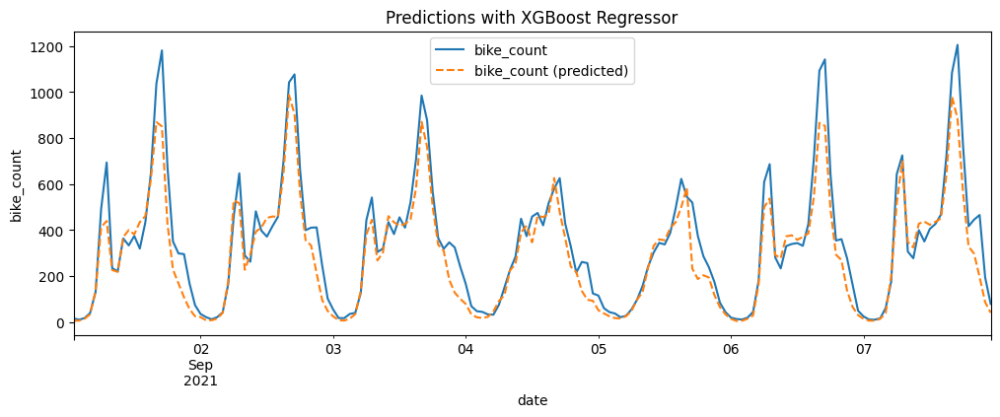

In [170]:
fig, ax = plt.subplots(figsize=(12, 4))

df_viz.plot(x="date", y="bike_count", ax=ax)
df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
ax.set_title("Predictions with XGBoost Regressor")
ax.set_ylabel("bike_count") 

## _LightGbm Regressor_

In [90]:
date_encoder = FunctionTransformer(_encode_dates)
date_cols = _encode_dates(X_train_comb[["date"]]).columns.tolist()
scaler = StandardScaler()

categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name", "site_name", "wind_dir"]
numerical_cols = X_train_comb.select_dtypes(include=np.number).columns

preprocessor = ColumnTransformer(
    [
        ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
        ("cat", categorical_encoder, categorical_cols),
        ("scaler", scaler, numerical_cols)
    ]
)
param_grid = {'learning_rate:':(.01,.02,.001,.1,.14,.2),
               'n_estimators':[500,800,1000,1300],
               'max_depth':[6,8,10,12,11],'min_data_in_leaf':[3,4,7],'device':['gpu']}

Boost = LGBMRegressor()

pipe2 =make_pipeline(date_encoder, preprocessor, GridSearchCV(Boost,param_grid,
                                                              cv = 5,n_jobs = 4))
pipe2.fit(X_train_comb, y_train)

[LightGBM] [Warning] Unknown parameter: learning_rate:
[LightGBM] [Warning] min_data_in_leaf is set=7, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7


Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name', 'site_name',
                                                   'wind_dir']),
                                                 ('scaler', St...
       'Humidity', 'Visibility', 'Precipitation', 'pressure1', 'sunshine_time',
       'suntime', 'new_cases', 'holidays2'],
      dtype='object'))])),
                ('gridsearchcv',
                 GridSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=4,
                              param_grid={'device': ['gpu'],
                                          'learning_rate:': (0.01, 0.02, 0.001,
                                                             0.1, 0.14, 0.2),
                                          'max_depth': [6, 8, 10, 12, 11],
                                          'min_data_in_leaf': [3, 4, 7],
                                          'n_estimators': [500, 800, 1000,
                                                           1300]}))])

In [111]:
date_encoder = FunctionTransformer(_encode_dates)
date_cols = _encode_dates(X_train_comb[["date"]]).columns.tolist()
scaler = StandardScaler()

categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name", "site_name", "wind_dir"]
numerical_cols = X_train_comb.select_dtypes(include=np.number).columns

preprocessor = ColumnTransformer(
    [
        ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
        ("cat", categorical_encoder, categorical_cols),
        ("scaler", scaler, numerical_cols)
    ]
)
param_grid = {'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 1500,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'device': 'gpu',
 'learning_rate:': 0.001,
 'min_data_in_leaf': 7}

Boost = LGBMRegressor(**param_grid)

pipe21 =make_pipeline(date_encoder, preprocessor,Boost)
pipe21.fit(X_train_comb, y_train)

[LightGBM] [Warning] Unknown parameter: learning_rate:
[LightGBM] [Warning] min_data_in_leaf is set=7, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7


Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name', 'site_name',
                                                   'wind_dir']),
                                                 ('scaler', StandardScaler(),
                                                  Index(['site_id', 'latitude', 'longitude', 'Temperature (C)', 'wind_speed',
       'Humidity', 'Visibility', 'Precipitation', 'pressure1', 'sunshine_time',
       'suntime', 'new_cases', 'holidays2'],
      dtype='object'))])),
                ('lgbmregressor',
                 LGBMRegressor(device='gpu', learning_rate:=0.001, max_depth=12,
                               min_data_in_leaf=7, n_estimators=1500))])

In [94]:
BestLGBM = pipe2[2].best_estimator_
BestLGBM


LGBMRegressor(device='gpu', learning_rate:=0.001, max_depth=12,
              min_data_in_leaf=7, n_estimators=1300)

In [108]:
Params_LGBM = BestLGBM.get_params()
Params_LGBM

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 1300,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'device': 'gpu',
 'learning_rate:': 0.001,
 'min_data_in_leaf': 7}

In [112]:
print(
    f"Train set, RMSE={mean_squared_error(y_train, pipe21.predict(X_train_comb), squared=False):.2f}"
)
print(
    f"Test set, RMSE={mean_squared_error(y_test, pipe21.predict(X_test_comb), squared=False):.2f}"
)

Train set, RMSE=0.36
Test set, RMSE=0.48


In [113]:
print(
    f"Train set, R^2={r2_score(y_train, pipe2.predict(X_train_comb)):.2f}"
)
print(
    f"Test set, R^2={r2_score(y_test, pipe2.predict(X_test_comb)):.2f}"
)

Train set, R^2=0.95
Test set, R^2=0.89


In [97]:
mask = (
    (X_test_comb["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (X_test_comb["date"] > pd.to_datetime("2021/09/01"))
    & (X_test_comb["date"] < pd.to_datetime("2021/09/08"))
)

df_viz = X_test_comb.loc[mask].copy()
df_viz["bike_count"] = np.exp(y_test[mask.values]) - 1
df_viz["bike_count (predicted)"] = np.exp(pipe2.predict(X_test_comb[mask])) - 1

Text(0, 0.5, 'bike_count')

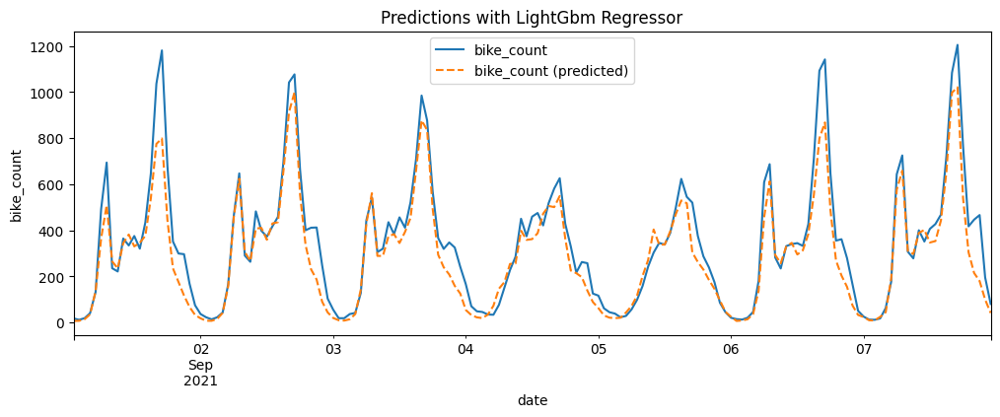

In [98]:
fig, ax = plt.subplots(figsize=(12, 4))

df_viz.plot(x="date", y="bike_count", ax=ax)
df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
ax.set_title("Predictions with LightGbm Regressor")
ax.set_ylabel("bike_count") 

## _CatBoost Regressor_

In [100]:
date_encoder = FunctionTransformer(_encode_dates)
date_cols = _encode_dates(X_train_comb[["date"]]).columns.tolist()
scaler = StandardScaler()

categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name", "site_name", "wind_dir"]
numerical_cols = X_train_comb.select_dtypes(include=np.number).columns

preprocessor = ColumnTransformer(
    [
        ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
        ("cat", categorical_encoder, categorical_cols),
        ("scaler", scaler, numerical_cols)
    ]
)


params ={'learning_rate': [.05,.1,.15],
         'max_depth':[6,8,10,12], 'iterations':[400,600,800,900], 'task_type': ['GPU'],
         'random_strength':[1,2,4,6]}

Boost = CatBoostRegressor()

pipe3 = make_pipeline(date_encoder, preprocessor, GridSearchCV(Boost,params,cv=4,verbose=10))

pipe3.fit(X_train_comb, y_train)

Fitting 4 folds for each of 162 candidates, totalling 648 fits
[CV 1/4; 1/162] START iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU
[CV 1/4; 1/162] END iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU;, score=nan total time=   0.3s
[CV 2/4; 1/162] START iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU
[CV 2/4; 1/162] END iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU;, score=nan total time=   0.2s
[CV 3/4; 1/162] START iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU
[CV 3/4; 1/162] END iterations=400, learning_rate=0.05, max_depth=6, random_strength=1, sampling_frequency=PerTreeLevel, task_type=GPU;, score=nan total time=   0.2s
[CV 4/4; 1/162] START iterat

c:\Users\Rehan Ibrahim\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
324 fits failed out of a total of 648.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
324 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Rehan Ibrahim\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Rehan Ibrahim\AppData\Local\Programs\Python\Python310\lib\site-packages\catboost\core.py", line 5730, in fit
    return self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, No

0:	learn: 1.5798105	total: 14.9ms	remaining: 11.9s
1:	learn: 1.4971578	total: 28.6ms	remaining: 11.4s
2:	learn: 1.4275725	total: 44.3ms	remaining: 11.8s
3:	learn: 1.3662277	total: 58.6ms	remaining: 11.7s
4:	learn: 1.3145780	total: 73.2ms	remaining: 11.6s
5:	learn: 1.2672942	total: 87.6ms	remaining: 11.6s
6:	learn: 1.2241703	total: 103ms	remaining: 11.7s
7:	learn: 1.1902100	total: 118ms	remaining: 11.7s
8:	learn: 1.1612600	total: 134ms	remaining: 11.8s
9:	learn: 1.1324431	total: 151ms	remaining: 11.9s
10:	learn: 1.1054321	total: 165ms	remaining: 11.8s
11:	learn: 1.0790836	total: 181ms	remaining: 11.9s
12:	learn: 1.0571000	total: 195ms	remaining: 11.8s
13:	learn: 1.0372705	total: 210ms	remaining: 11.8s
14:	learn: 1.0196810	total: 226ms	remaining: 11.8s
15:	learn: 1.0008917	total: 242ms	remaining: 11.9s
16:	learn: 0.9841984	total: 261ms	remaining: 12s
17:	learn: 0.9676152	total: 293ms	remaining: 12.7s
18:	learn: 0.9505439	total: 316ms	remaining: 13s
19:	learn: 0.9385475	total: 333ms	remai

Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name', 'site_name',
                                                   'wind_dir']),
                                                 ('scaler', St...
       'suntime', 'new_cases', 'holidays2'],
      dtype='object'))])),
                ('gridsearchcv',
                 GridSearchCV(cv=4,
                              estimator=<catboost.core.CatBoostRegressor object at 0x0000023175C93E80>,
                              param_grid={'iterations': [400, 600, 800],
                                          'learning_rate': [0.05, 0.1, 0.15],
                                          'max_depth': [6, 8, 10],
                                          'random_strength': [1, 2, 4],
                                          'sampling_frequency': ['PerTreeLevel',
                                                                 'PerTree'],
                                          'task_type': ['GPU']},
                              verbose=10))])

In [164]:
date_encoder = FunctionTransformer(_encode_dates)
date_cols = ["year", "month", "day", "weekday", "hour"]
scaler = StandardScaler()
categorical_encoder = OneHotEncoder(handle_unknown="ignore")
categorical_cols = ["counter_name", "site_name", "wind_dir"]
numerical_cols = ['site_id', 'latitude', 'longitude', 'Temperature (C)', 'wind_speed',
                      'Humidity', 'Visibility', 'pressure1', 'sunshine_time', 'suntime', 'new_cases']

preprocessor = ColumnTransformer(
        [
            ("date", OneHotEncoder(handle_unknown="ignore"), date_cols),
            ("cat", categorical_encoder, categorical_cols),
            ("scaler", scaler, numerical_cols)
        ]
    )
params = {'iterations': 800,
              'learning_rate': 0.1,
              'loss_function': 'RMSE',
              'random_strength': 6,
              'task_type': 'GPU',
              'max_depth': 10}

Boost = CatBoostRegressor(**params)

pipe9 = make_pipeline(date_encoder, preprocessor, Boost)

 
pipe9.fit(X_train_comb, y_train)

0:	learn: 1.5705250	total: 28.4ms	remaining: 22.7s
1:	learn: 1.4827741	total: 58.4ms	remaining: 23.3s
2:	learn: 1.4041328	total: 88.5ms	remaining: 23.5s
3:	learn: 1.3362843	total: 115ms	remaining: 22.9s
4:	learn: 1.2770009	total: 142ms	remaining: 22.5s
5:	learn: 1.2233873	total: 168ms	remaining: 22.2s
6:	learn: 1.1792025	total: 194ms	remaining: 22s
7:	learn: 1.1410089	total: 222ms	remaining: 22s
8:	learn: 1.1105863	total: 249ms	remaining: 21.9s
9:	learn: 1.0787792	total: 279ms	remaining: 22s
10:	learn: 1.0526484	total: 307ms	remaining: 22s
11:	learn: 1.0248888	total: 334ms	remaining: 21.9s
12:	learn: 1.0022707	total: 361ms	remaining: 21.8s
13:	learn: 0.9778403	total: 387ms	remaining: 21.7s
14:	learn: 0.9598404	total: 413ms	remaining: 21.6s
15:	learn: 0.9402895	total: 439ms	remaining: 21.5s
16:	learn: 0.9227873	total: 466ms	remaining: 21.4s
17:	learn: 0.9080217	total: 492ms	remaining: 21.4s
18:	learn: 0.8928942	total: 524ms	remaining: 21.5s
19:	learn: 0.8806279	total: 550ms	remaining: 2

Pipeline(steps=[('functiontransformer',
                 FunctionTransformer(func=<function _encode_dates at 0x000002310EBCDEA0>)),
                ('columntransformer',
                 ColumnTransformer(transformers=[('date',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['year', 'month', 'day',
                                                   'weekday', 'hour']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['counter_name', 'site_name',
                                                   'wind_dir']),
                                                 ('scaler', StandardScaler(),
                                                  ['site_id', 'latitude',
                                                   'longitude',
                                                   'Temperature (C)',
                                                   'wind_speed', 'Humidity',
                                                   'Visibility', 'pressure1',
                                                   'sunshine_time', 'suntime',
                                                   'new_cases'])])),
                ('catboostregressor',
                 <catboost.core.CatBoostRegressor object at 0x000002317C1DA230>)])

In [144]:
BestCGB = pipe3[2].best_estimator_
BestCGB

In [145]:
Params_CGB = BestCGB.get_params()
Params_CGB

{'iterations': 800,
 'learning_rate': 0.1,
 'loss_function': 'RMSE',
 'random_strength': 4,
 'task_type': 'GPU',
 'sampling_frequency': 'PerTree',
 'max_depth': 10}

In [146]:
pd.DataFrame(pipe3[2].cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_iterations,param_learning_rate,param_max_depth,param_random_strength,param_sampling_frequency,param_task_type,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.354395,0.023223,0.000000,0.000000,400,0.05,6,1,PerTreeLevel,GPU,"{'iterations': 400, 'learning_rate': 0.05, 'ma...",NaN,NaN,NaN,NaN,NaN,NaN,108
1,3.834403,0.330561,0.099072,0.006516,400,0.05,6,1,PerTree,GPU,"{'iterations': 400, 'learning_rate': 0.05, 'ma...",0.819540,0.795918,0.781807,0.757828,0.788773,0.022382,80
2,0.272599,0.021476,0.000000,0.000000,400,0.05,6,2,PerTreeLevel,GPU,"{'iterations': 400, 'learning_rate': 0.05, 'ma...",NaN,NaN,NaN,NaN,NaN,NaN,132
3,3.602673,0.037573,0.106026,0.006369,400,0.05,6,2,PerTree,GPU,"{'iterations': 400, 'learning_rate': 0.05, 'ma...",0.815307,0.797254,0.790853,0.758671,0.790521,0.020459,79
4,0.286166,0.003001,0.000000,0.000000,400,0.05,6,4,PerTreeLevel,GPU,"{'iterations': 400, 'learning_rate': 0.05, 'ma...",NaN,NaN,NaN,NaN,NaN,NaN,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,20.540425,0.598780,0.349789,0.047464,800,0.15,10,1,PerTree,GPU,"{'iterations': 800, 'learning_rate': 0.15, 'ma...",0.824587,0.851198,0.829656,0.764104,0.817386,0.032344,6
158,0.377784,0.036492,0.000000,0.000000,800,0.15,10,2,PerTreeLevel,GPU,"{'iterations': 800, 'learning_rate': 0.15, 'ma...",NaN,NaN,NaN,NaN,NaN,NaN,85
159,20.458183,0.748089,0.331288,0.044213,800,0.15,10,2,PerTree,GPU,"{'iterations': 800, 'learning_rate': 0.15, 'ma...",0.812884,0.855362,0.827502,0.767174,0.815731,0.031918,11
160,0.375075,0.032244,0.000000,0.000000,800,0.15,10,4,PerTreeLevel,GPU,"{'iterations': 800, 'learning_rate': 0.15, 'ma...",NaN,NaN,NaN,NaN,NaN,NaN,149


In [165]:
print(
    f"Train set, R^2={r2_score(y_train, pipe9.predict(X_train_comb)):.5f}"
)
print(
    f"Test set, R^2={r2_score(y_test, pipe9.predict(X_test_comb)):.5f}"
)

Train set, R^2=0.95968
Test set, R^2=0.89668


In [166]:
print(
    f"Train set, RMSE={mean_squared_error(y_train, pipe9.predict(X_train_comb), squared=False):.5f}"
)
print(
    f"Test set, RMSE={mean_squared_error(y_test, pipe9.predict(X_test_comb), squared=False):.5f}"
)

Train set, RMSE=0.33637
Test set, RMSE=0.46257


In [149]:
mask = (
    (X_test_comb["counter_name"] == "Totem 73 boulevard de Sébastopol S-N")
    & (X_test_comb["date"] > pd.to_datetime("2021/09/01"))
    & (X_test_comb["date"] < pd.to_datetime("2021/09/08"))
)

df_viz = X_test_comb.loc[mask].copy()
df_viz["bike_count"] = np.exp(y_test[mask.values]) - 1
df_viz["bike_count (predicted)"] = np.exp(pipe3.predict(X_test_comb[mask])) - 1

Text(0, 0.5, 'bike_count')

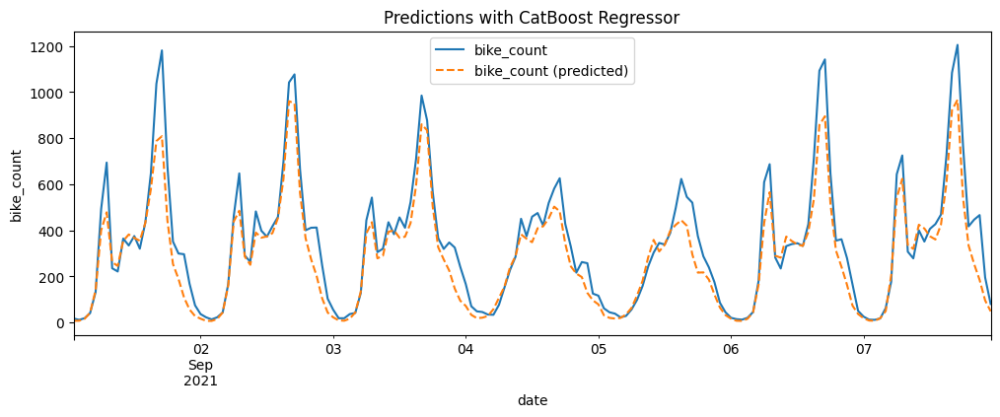

In [150]:
fig, ax = plt.subplots(figsize=(12, 4))

df_viz.plot(x="date", y="bike_count", ax=ax)
df_viz.plot(x="date", y="bike_count (predicted)", ax=ax, ls="--")
ax.set_title("Predictions with CatBoost Regressor")
ax.set_ylabel("bike_count") 

In [151]:
joblib.dump(pipe3, 'CatBoost')
joblib.dump(pipe3[2].best_estimator_, 'CatBoost Best Model')

['CatBoost Best Model']